In [ ]:
### COnvert wrong labels

In [39]:
import os
from pathlib import Path

In [40]:
def convert_labels(input_dir, output_dir):
    label_files = sorted(Path(input_dir).glob("*.txt"))

    for label_file in label_files:
        output_file = Path(output_dir) / label_file.name

        with open(label_file, "r") as f:
            labels = f.readlines()

        with open(output_file, "w") as f:
            for label in labels:
                id, x, y, width, height = map(float, label.split())

                # Convert to center coordinates
                x_center = x + width / 2
                y_center = y + height / 2

                new_label = f"{id} {x_center} {y_center} {width} {height}\n"
                f.write(new_label)


In [43]:
# Call the function to convert the labels
convert_labels('../raw_data/task_2/parasite/YOLO_FORMAT_2/valid/labels', '../raw_data/task_2/parasite/YOLO_FORMAT_2/valid/labels_new')


In [ ]:
## Plot labels generated on YOLO Format

In [35]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def plot_images_with_labels(image_dir, label_dir, img_width, img_height):
    # Get list of image filenames
    image_files = os.listdir(image_dir)

    for image_file in image_files:
        # Check if the file is a JPEG image
        if image_file.endswith(".jpg"):
            # Get the corresponding label filename
            fig, ax = plt.subplots(1, 1, figsize=(10, 10))
            label_file = os.path.join(label_dir, os.path.splitext(image_file)[0] + ".txt")

            # Read the label file
            with open(label_file, "r") as f:
                labels = f.readlines()
            
            # Load and plot the image
            image_path = os.path.join(image_dir, image_file)
            image = plt.imread(image_path)
            plt.imshow(image)
            plt.axis("off")

            # Plot the bounding box labels
            for label in labels:
                label = label.strip().split()
                #print(label)
                _, x, y, width, height = map(float, label)
                bbox = plt.Rectangle(( (x-(width/2))*img_width, (y - (height/2) )*img_height), width*img_width, height*img_height, 
                                     fill=False, edgecolor="black", linewidth=1)
                plt.gca().add_patch(bbox)
                

            # Show the plot
            plt.show()
        #break

# Define the image directory and label directory
image_dir = "path/to/images"
label_dir = "path/to/labels"




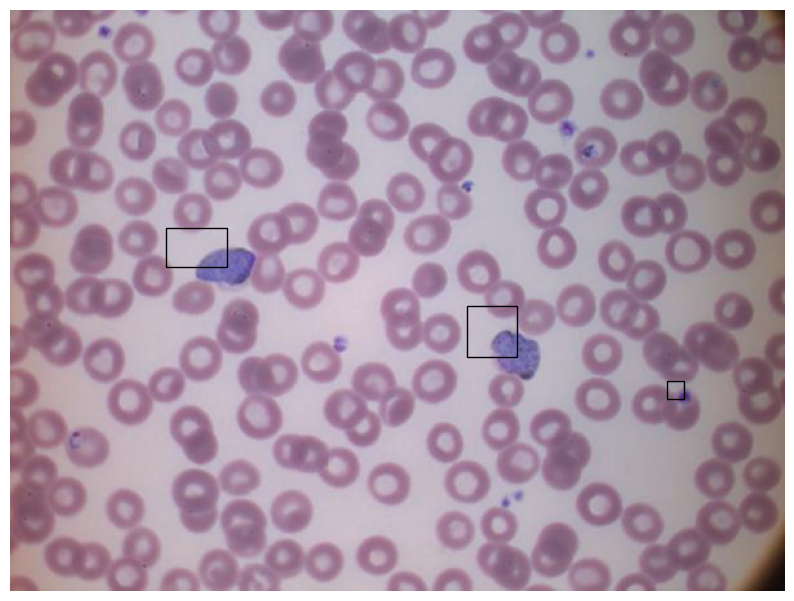

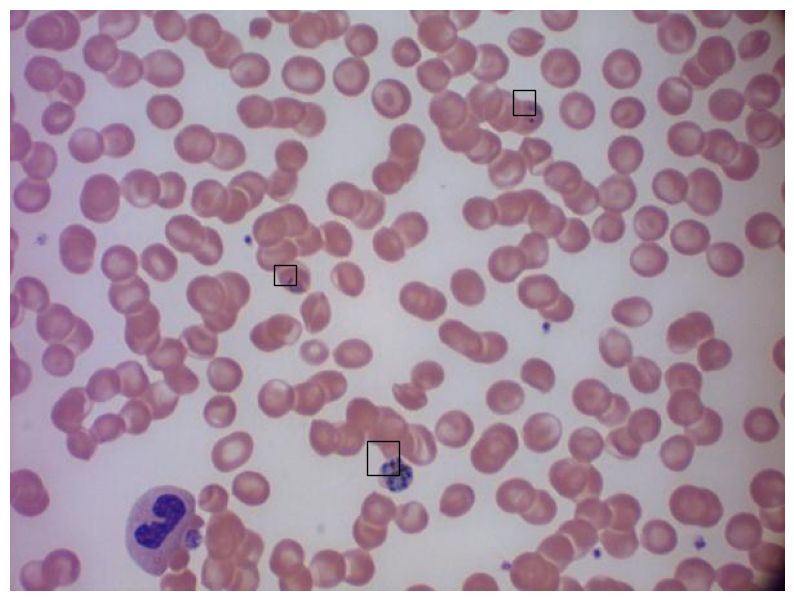

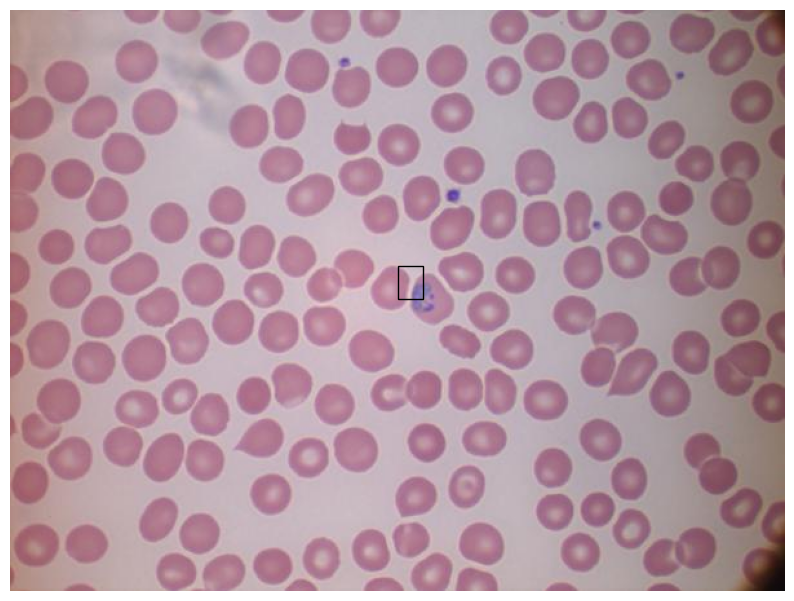

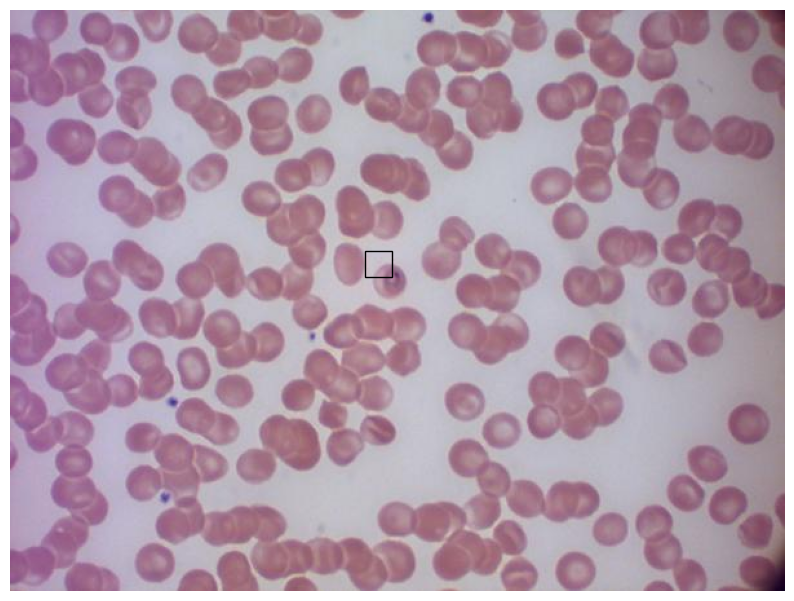

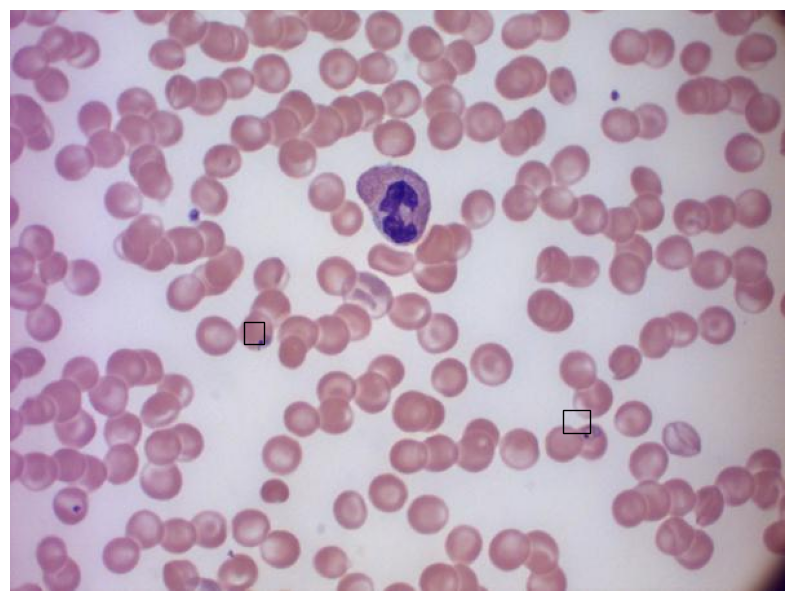

...

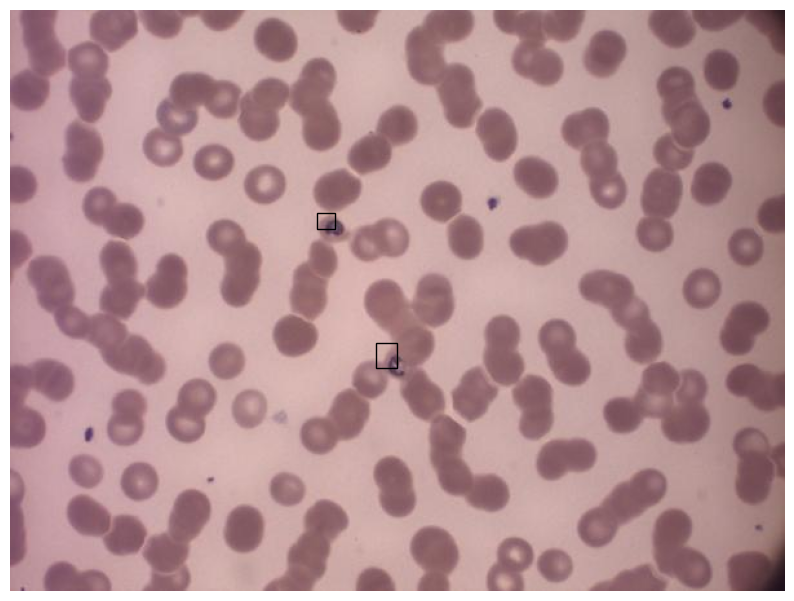

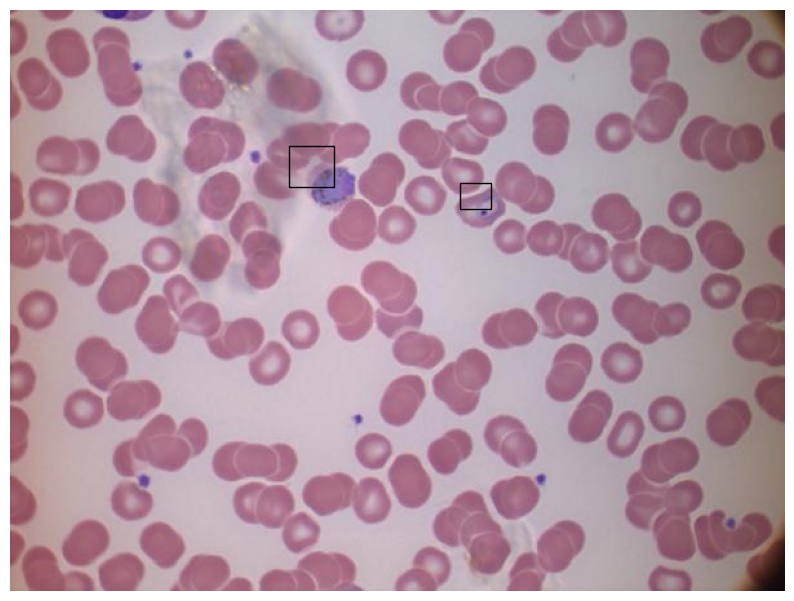

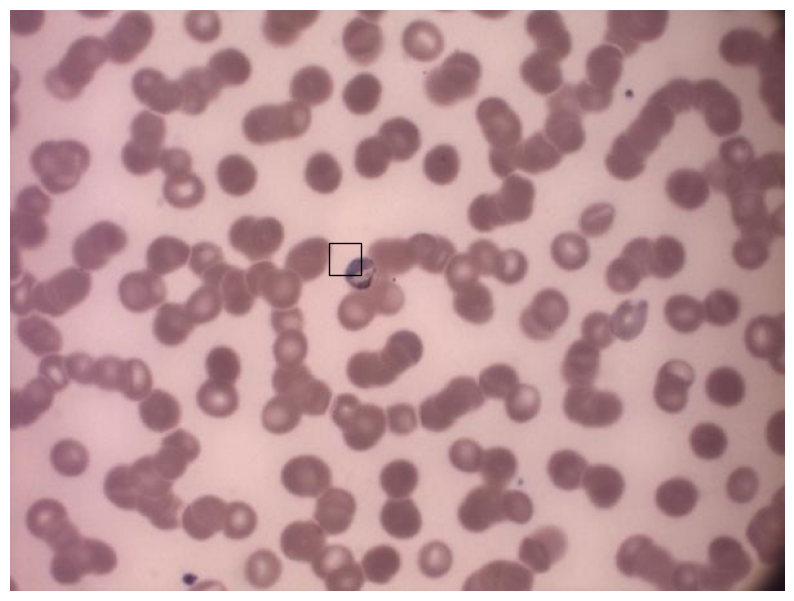

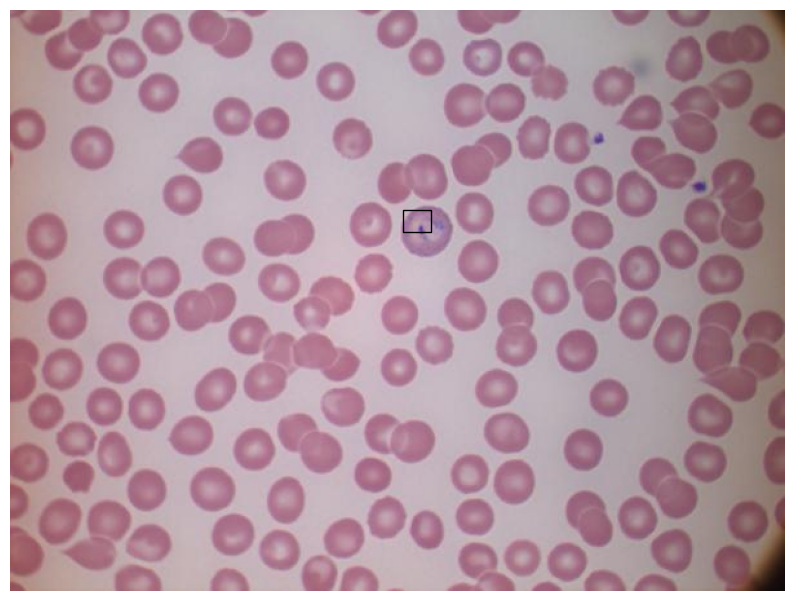

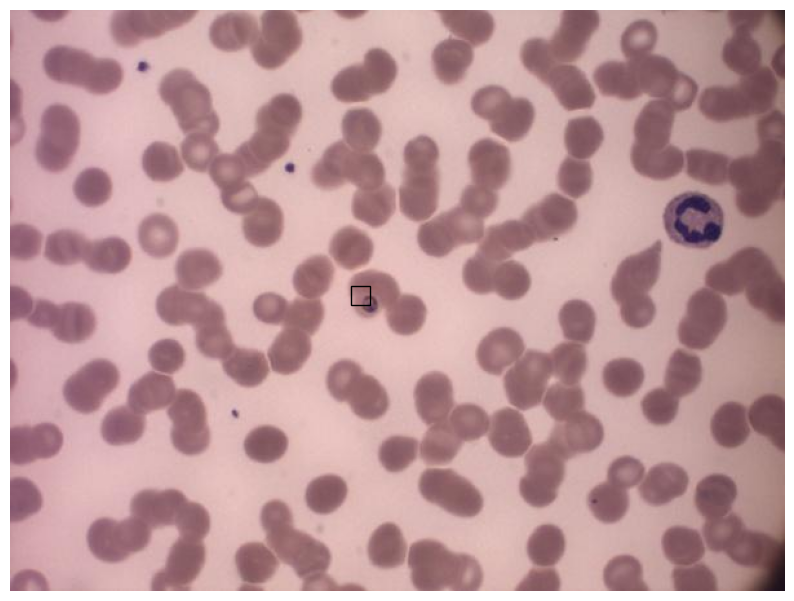

In [36]:
# Call the function to plot images with labels
plot_images_with_labels('../raw_data/task_2/parasite/YOLO_FORMAT_2/test/changed', '../raw_data/task_2/parasite/YOLO_FORMAT_2/test/labels',600,450)